In [1]:
# For reading annotations file
from pycocotools.coco import COCO
import json

# Reading annotations.json
TRAIN_ANNOTATIONS_PATH = "data/train/annotations.json"
TRAIN_IMAGE_DIRECTIORY = "data/train/images/"

VAL_ANNOTATIONS_PATH = "data/val/annotations.json"
VAL_IMAGE_DIRECTIORY = "data/val/images/"

In [2]:
# Reading the annotation files
with open(TRAIN_ANNOTATIONS_PATH) as f:
    train_annotations_data = json.load(f)

with open(VAL_ANNOTATIONS_PATH) as f:
    val_annotations_data = json.load(f)

train_annotations_data['annotations'][0]

{'area': 71393.0,
 'bbox': [61.5, 61.5, 318.0, 322.0],
 'category_id': 101246,
 'id': 184123,
 'image_id': 131072,
 'iscrowd': 0,
 'segmentation': [[169.0,
   379.5,
   130.0,
   374.5,
   112.0,
   363.5,
   94.5,
   340.0,
   61.5,
   213.0,
   61.5,
   188.0,
   70.5,
   168.0,
   87.0,
   152.5,
   103.0,
   143.5,
   123.0,
   139.5,
   185.0,
   118.5,
   226.0,
   90.5,
   249.0,
   87.5,
   309.0,
   88.5,
   339.0,
   110.5,
   350.5,
   125.00000000000001,
   354.5,
   155.0,
   382.5,
   231.0,
   383.5,
   277.0,
   360.0,
   303.5,
   327.0,
   331.5,
   308.0,
   343.5,
   216.0,
   373.5]]}

In [3]:
from tqdm.notebook import tqdm
import cv2

# Function for taking a annotation & directiory of images and returning new annoation json with fixed image size info
def fix_data(annotations, directiory, PRINTF = False):
    for n, i in enumerate(tqdm((annotations['images']))):
   
        img = cv2.imread(directiory+i["file_name"])

        if img.shape[0] != i['height']:
            annotations['images'][n]['height'] = img.shape[0]
            if PRINTF:
                print(i["file_name"])
                print(annotations['images'][n], img.shape)

        if img.shape[1] != i['width']:
            annotations['images'][n]['width'] = img.shape[1]
            if PRINTF:
                print(i["file_name"])
                print(annotations['images'][n], img.shape)

    return annotations   

train_annotations_data = fix_data(train_annotations_data, TRAIN_IMAGE_DIRECTIORY, False)
val_annotations_data = fix_data(val_annotations_data, VAL_IMAGE_DIRECTIORY, False)

  0%|          | 0/54392 [00:00<?, ?it/s]

  0%|          | 0/946 [00:00<?, ?it/s]

In [7]:
from pycocotools import mask as mutils
import numpy as np
import pycocotools._mask as _mask
from tqdm.notebook import tqdm

train_coco = COCO('data/train/annotations.json')
val_coco = COCO('data/val/annotations.json')
    
def find_bbox(segm, size_h, size_w):
    rle = {'counts': segm, 'size': [size_h, size_w]}
    compressed_rle = mutils.frPyObjects(segm, rle.get('size')[0], rle.get('size')[1])
    return mutils.toBbox(compressed_rle), mutils.area(compressed_rle)
    

def fix_bbox(annotations, max_ann, max_id_ann, is_train):
    for n, ann in enumerate(tqdm((annotations['annotations']))):
        if (n == max_ann):
            return annotations
        ann_draft = ann
        segm_draft = ann["segmentation"]
        
        img_id = ann["image_id"]
        
        if is_train:
            dict_img = train_coco.loadImgs(img_id)
        else:
            dict_img = val_coco.loadImgs(img_id)

        w = dict_img[0]["width"]
        h = dict_img[0]["height"]
        
        bboxes, area = find_bbox(segm_draft, h, w)
        bboxes = bboxes.tolist()
        area = area.tolist()
        annotations["annotations"][n]["bbox"], bboxes = bboxes[0], bboxes[1:]
        annotations["annotations"][n]["segmentation"], segm_draft = [segm_draft[0]], segm_draft[1:]
        annotations["annotations"][n]["area"], area = area[0], area[1:]
        
        for i in range(len(bboxes)):
            new_ann = {'id': max_id_ann,
             'image_id': ann["image_id"],
             'category_id': ann["category_id"],
             'segmentation': [segm_draft[i]],
             'area': area[i],
             'bbox': bboxes[i],
             'iscrowd': 0
            }
            max_id_ann += 1
            annotations["annotations"].append(new_ann)
            
    return annotations



print("Sizes before fixing: ", len(train_annotations_data['annotations']), (len(val_annotations_data['annotations'])))
final_train = fix_bbox(train_annotations_data, len(train_annotations_data['annotations']), 325846, True)
final_val = fix_bbox(val_annotations_data, len(val_annotations_data['annotations']), 325403, False)
print("Sizes after fixing: ", len(final_train['annotations']), (len(final_val['annotations'])))

loading annotations into memory...
Done (t=4.98s)
creating index...
index created!
loading annotations into memory...
Done (t=0.04s)
creating index...
index created!
Sizes before fixing:  100256 1708


  0%|          | 0/100256 [00:00<?, ?it/s]

  0%|          | 0/1708 [00:00<?, ?it/s]

Sizes after fixing:  123950 2205


In [32]:
for i in final_train["annotations"]:
    if(len(i["segmentation"][0]) < 4):
        i["image_id"] = -1;
        i["id"] = -1;
        print(i)
        
for i in final_val["annotations"]:
    if(len(i["segmentation"][0]) < 4):
        i["image_id"] = -1;
        i["id"] = -1;
        print(i)  

{'id': -1, 'image_id': -1, 'category_id': 101308, 'segmentation': [[292.53, 320.45]], 'area': 0, 'bbox': [0.0, 0.0, 0.0, 0.0], 'iscrowd': 0}
{'id': -1, 'image_id': -1, 'category_id': 101144, 'segmentation': [[554.2425, 696.9575]], 'area': 0, 'bbox': [0.0, 0.0, 0.0, 0.0], 'iscrowd': 0}
{'id': -1, 'image_id': -1, 'category_id': 100195, 'segmentation': [[287.046923828125, 277.4460333251953]], 'area': 0, 'bbox': [0.0, 0.0, 0.0, 0.0], 'iscrowd': 0}
{'id': -1, 'image_id': -1, 'category_id': 101285, 'segmentation': [[169.92375, 227.56875000000002]], 'area': 0, 'bbox': [0.0, 0.0, 0.0, 0.0], 'iscrowd': 0}
{'id': -1, 'image_id': -1, 'category_id': 100078, 'segmentation': [[142.8, 286.4800048828125]], 'area': 0, 'bbox': [0.0, 0.0, 0.0, 0.0], 'iscrowd': 0}
{'id': -1, 'image_id': -1, 'category_id': 101201, 'segmentation': [[446.67517333984375, 319.2594976043701]], 'area': 0, 'bbox': [0.0, 0.0, 0.0, 0.0], 'iscrowd': 0}
{'id': -1, 'image_id': -1, 'category_id': 101193, 'segmentation': [[228.399975585

In [33]:
with open('data/train/train_ann_final.json', 'w') as f:
    json.dump(final_train, f)
    
with open('data/val/val_ann_final.json', 'w') as f:
    json.dump(final_val, f)

In [8]:
# For reading annotations file
from pycocotools.coco import COCO
import json

with open('data/train/train_ann_final.json') as f:
    train_json = json.load(f)
    
with open('data/val/val_ann_final.json') as f:
    val_json = json.load(f)

train_json['annotations'][0]
coco = COCO('data/train/train_ann_final.json')

loading annotations into memory...
Done (t=5.24s)
creating index...
index created!


In [35]:
for i in val_json["annotations"]:
    if(len(i["segmentation"][0]) < 4):
        print(i)

{'id': -1, 'image_id': -1, 'category_id': 100089, 'segmentation': [[298.6280090332031, 287.3511646270752]], 'area': 0, 'bbox': [0.0, 0.0, 0.0, 0.0], 'iscrowd': 0}
{'id': -1, 'image_id': -1, 'category_id': 100949, 'segmentation': [[294.04862915039064, 199.2893655014038]], 'area': 0, 'bbox': [0.0, 0.0, 0.0, 0.0], 'iscrowd': 0}
{'id': -1, 'image_id': -1, 'category_id': 100145, 'segmentation': [[216.92000000000002, 167.96800354003906]], 'area': 0, 'bbox': [0.0, 0.0, 0.0, 0.0], 'iscrowd': 0}
{'id': -1, 'image_id': -1, 'category_id': 100486, 'segmentation': [[225.89000000000001, 195.6143353271484]], 'area': 0, 'bbox': [0.0, 0.0, 0.0, 0.0], 'iscrowd': 0}


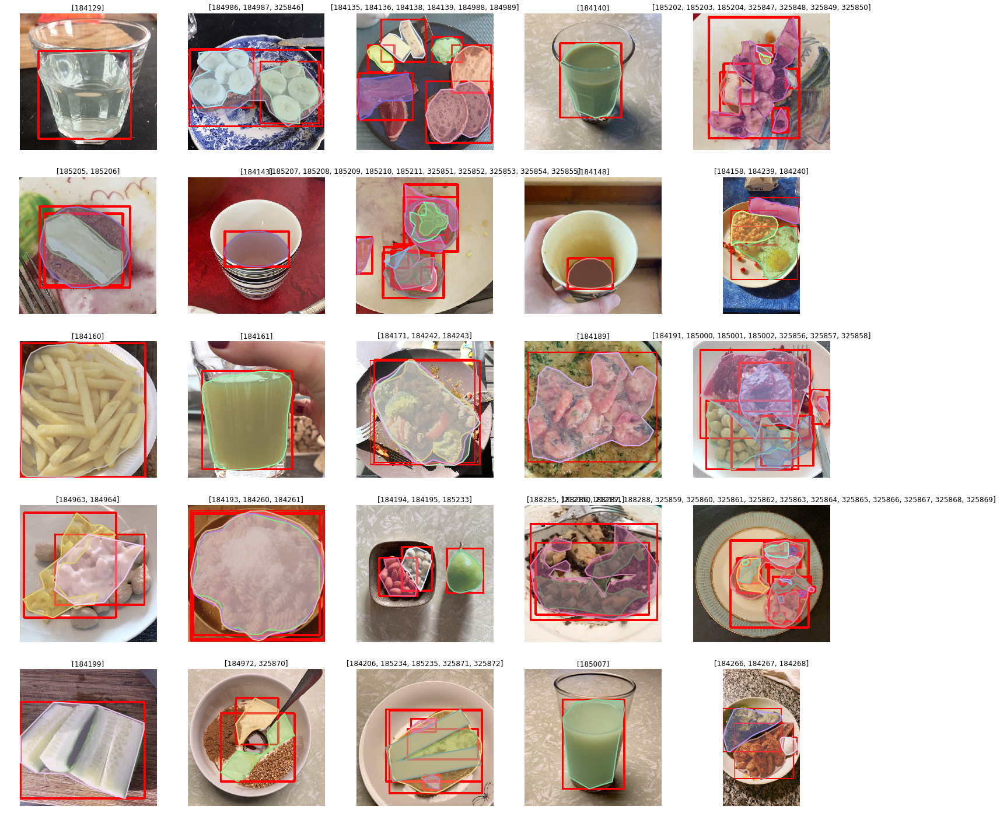

In [36]:
import cv2
import matplotlib.pyplot as plt


w, h = 15, 15 # Setting width and height of every image
rows, cols = 5, 5 # Setting the number of image rows & cols

fig = plt.figure(figsize=(25, 25)) # Making the figure with size 

plt.axis('off')
# Going thought every cell in rows and cols
for i in range(1, cols * rows+1):
    annIds = coco.getAnnIds(imgIds=train_json["images"][i]["id"])
    
    anns = coco.loadAnns(annIds)

    fig.add_subplot(rows, cols, i)

    img = plt.imread(TRAIN_IMAGE_DIRECTIORY+train_json["images"][i]["file_name"])
    for i in anns:
        [x,y,w,h] = i['bbox']
        cv2.rectangle(img, (int(x), int(y)), (int(x+w), int(y+h)), (255,0,0), 5)

    plt.title(annIds) 
    plt.imshow(img)

    # Render annotations on top of the image
    train_coco.showAnns(anns)

    # Setting the axis off
    plt.axis("off")

# Showing the figure
plt.show()

loading annotations into memory...
Done (t=0.04s)
creating index...
index created!


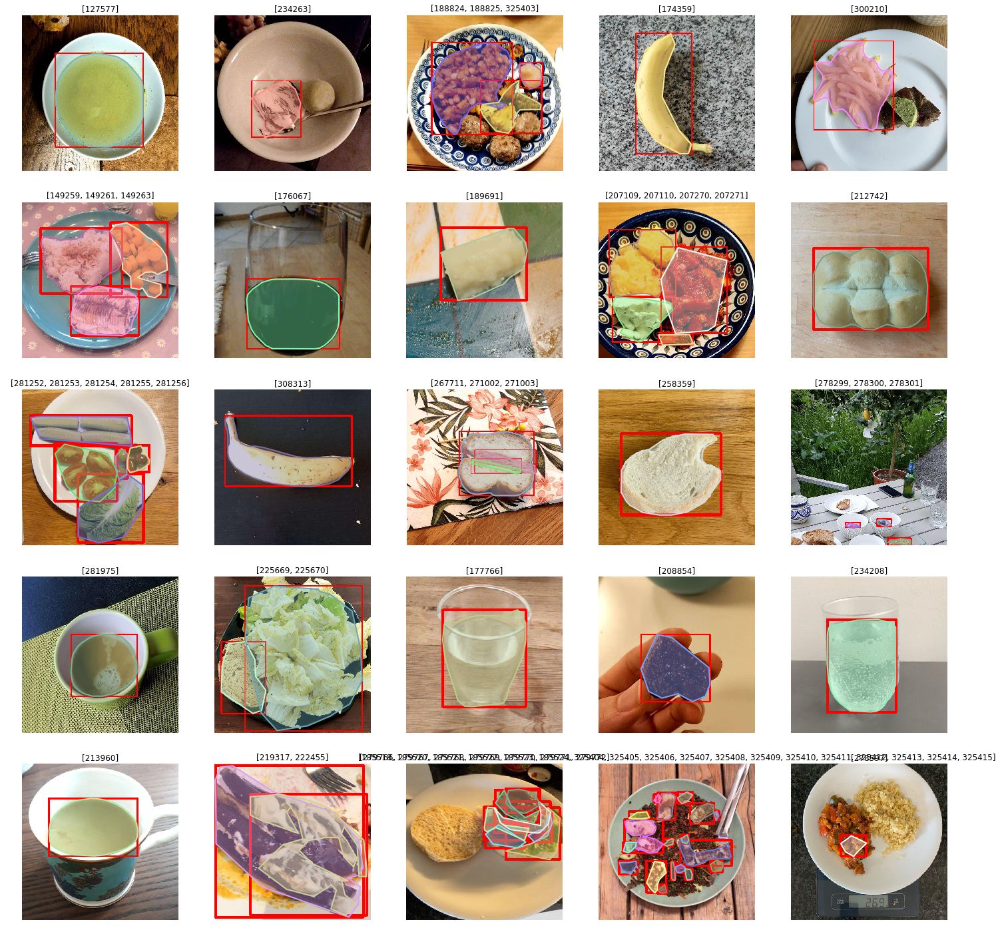

In [37]:
import cv2
import matplotlib.pyplot as plt

coco_val = COCO('data/val/val_ann_final.json')
w, h = 15, 15 # Setting width and height of every image
rows, cols = 5, 5 # Setting the number of image rows & cols

fig = plt.figure(figsize=(25, 25)) # Making the figure with size 

plt.axis('off')
# Going thought every cell in rows and cols
for i in range(1, cols * rows+1):
    annIds = coco_val.getAnnIds(imgIds=val_json["images"][i]["id"])
    
    anns = coco_val.loadAnns(annIds)

    fig.add_subplot(rows, cols, i)

    img = plt.imread(VAL_IMAGE_DIRECTIORY+val_json["images"][i]["file_name"])
    for i in anns:
        [x,y,w,h] = i['bbox']
        cv2.rectangle(img, (int(x), int(y)), (int(x+w), int(y+h)), (255,0,0), 5)

    plt.title(annIds) 
    plt.imshow(img)

    # Render annotations on top of the image
    train_coco.showAnns(anns)

    # Setting the axis off
    plt.axis("off")

# Showing the figure
plt.show()

In [38]:


classes_names = [category["name"] for category in train_json["categories"]]
print(len(classes_names), classes_names)

323 ['beetroot-steamed-without-addition-of-salt', 'bread_wholemeal', 'jam', 'water', 'bread', 'banana', 'soft_cheese', 'ham_raw', 'hard_cheese', 'cottage_cheese', 'coffee', 'fruit_mixed', 'pancake', 'tea', 'salmon_smoked', 'avocado', 'spring_onion_scallion', 'ristretto_with_caffeine', 'ham_n_s', 'egg', 'bacon', 'chips_french_fries', 'juice_apple', 'chicken', 'tomato', 'broccoli', 'shrimp_prawn', 'carrot', 'chickpeas', 'french_salad_dressing', 'pasta_hornli_ch', 'sauce_cream', 'pasta_n_s', 'tomato_sauce', 'cheese_n_s', 'pear', 'cashew_nut', 'almonds', 'lentil_n_s', 'mixed_vegetables', 'peanut_butter', 'apple', 'blueberries', 'cucumber', 'yogurt', 'butter', 'mayonnaise', 'soup', 'wine_red', 'wine_white', 'green_bean_steamed_without_addition_of_salt', 'sausage', 'pizza_margherita_baked', 'salami_ch', 'mushroom', 'tart_n_s', 'rice', 'white_coffee', 'sunflower_seeds', 'bell_pepper_red_raw', 'zucchini', 'asparagus', 'tartar_sauce', 'lye_pretzel_soft', 'cucumber_pickled_ch', 'curry_vegetarian

In [36]:
import os

CONFIG = {
    'mask': {
        'config_file': '/home/nkorneich/AICrowd/mmdetection/configs/mask_rcnn/mask_rcnn_r101_fpn_1x_coco.py'
    }
}

selected_model = 'mask'

# name of the config file.
config_file = CONFIG[selected_model]['config_file']

assert os.path.isfile(config_file), '`{}` not exist'.format(config_file)
config_file

'/home/nkorneich/AICrowd/mmdetection/configs/mask_rcnn/mask_rcnn_r101_fpn_1x_coco.py'

In [46]:
%cd ..
#!pip install -e .

/home/nkorneich/AICrowd


In [59]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = "1,2,3,5,6,7"

from mmcv import Config
from mmdet.apis import set_random_seed

cfg = Config.fromfile(config_file)

cfg.classes = classes_names
cfg.dataset_type = "CocoDataset"
cfg.data_root = "data/"

cfg.data.test.type = 'CocoDataset'
cfg.data.test.data_root = 'data/val/'
cfg.data.test.ann_file = 'val_ann_final.json'
cfg.data.test.img_prefix = 'images/'
cfg.data.test.classes = cfg.classes

cfg.data.train.type = 'CocoDataset'
cfg.data.train.data_root = 'data/train/'
cfg.data.train.ann_file = 'train_ann_final.json'
cfg.data.train.img_prefix = 'images/'
cfg.data.train.classes = cfg.classes

cfg.data.val.type = 'CocoDataset'
cfg.data.val.data_root = 'data/val/'
cfg.data.val.ann_file = 'val_ann_final.json'
cfg.data.val.img_prefix = 'images/'
cfg.data.val.classes = cfg.classes

cfg.data.samples_per_gpu=4
cfg.data.workers_per_gpu=4

cfg.model.roi_head.bbox_head.num_classes = 323

cfg.model.roi_head.mask_head.num_classes = 323

cfg.work_dir = './results_mask'
#cfg.load_from = 'models_pretrain/faster_rcnn_r50.pth'

cfg.optimizer.lr = 0.02
#cfg.lr_config.warmup = None
#cfg.log_config.interval = 10


#cfg.evaluation.metric = 'bbox'
# set the evaluation interval
cfg.evaluation.interval = 10
# set the checkpoint saving interval
cfg.checkpoint_config.interval = 10
cfg.runner.max_epochs = 50


# results are more reproducible
cfg.seed = 0
set_random_seed(0, deterministic=False)
cfg.gpu_ids = [1,2,3,5,6,7]


print(f'Config:\n{cfg.pretty_text}')

cfg.dump("my_config_mask_rcnn.py")

Config:
model = dict(
    type='MaskRCNN',
    backbone=dict(
        type='ResNet',
        depth=101,
        num_stages=4,
        out_indices=(0, 1, 2, 3),
        frozen_stages=1,
        norm_cfg=dict(type='BN', requires_grad=True),
        norm_eval=True,
        style='pytorch',
        init_cfg=dict(type='Pretrained',
                      checkpoint='torchvision://resnet101')),
    neck=dict(
        type='FPN',
        in_channels=[256, 512, 1024, 2048],
        out_channels=256,
        num_outs=5),
    rpn_head=dict(
        type='RPNHead',
        in_channels=256,
        feat_channels=256,
        anchor_generator=dict(
            type='AnchorGenerator',
            scales=[8],
            ratios=[0.5, 1.0, 2.0],
            strides=[4, 8, 16, 32, 64]),
        bbox_coder=dict(
            type='DeltaXYWHBBoxCoder',
            target_means=[0.0, 0.0, 0.0, 0.0],
            target_stds=[1.0, 1.0, 1.0, 1.0]),
        loss_cls=dict(
            type='CrossEntropyLoss', us

In [41]:

!mmdetection/tools/dist_train.sh "my_config_mask_rcnn.py" 6 --work-dir 'results_mask'

fatal: Not a git repository (or any parent up to mount point /home)
Stopping at filesystem boundary (GIT_DISCOVERY_ACROSS_FILESYSTEM not set).
fatal: Not a git repository (or any parent up to mount point /home)
Stopping at filesystem boundary (GIT_DISCOVERY_ACROSS_FILESYSTEM not set).
2022-04-26 23:42:27,959 - mmdet - INFO - Environment info:
------------------------------------------------------------
sys.platform: linux
Python: 3.6.3 (default, Jul 10 2018, 22:49:05) [GCC 4.8.5 20150623 (Red Hat 4.8.5-28)]
CUDA available: True
GPU 0,1,2,3,4,5: Tesla V100-SXM2-32GB
CUDA_HOME: /cm/shared/apps/cuda10.1/toolkit/10.1.168
NVCC: Cuda compilation tools, release 10.1, V10.1.168
GCC: gcc (GCC) 7.2.0
PyTorch: 1.8.1+cu102
PyTorch compiling details: PyTorch built with:
  - GCC 7.3
  - C++ Version: 201402
  - Intel(R) Math Kernel Library Version 2020.0.0 Product Build 20191122 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v1.7.0 (Git Hash 7aed236906b1f7a05c0917e5257a1af05e9ff683)
 

In [60]:
os.environ['CUDA_VISIBLE_DEVICES'] = "1,2,3,5,6,7"
!mmdetection/tools/dist_test.sh "my_config_mask_rcnn.py" "results_mask/latest.pth" 6 --out "result_test.pkl" --eval bbox segm

/home/nkorneich/AICrowd/mmdetection/mmdet/datasets/api_wrappers/coco_api.py:22: UserWarning: mmpycocotools is deprecated. Please install official pycocotools by "pip install pycocotools"
  UserWarning)
loading annotations into memory...
/home/nkorneich/AICrowd/mmdetection/mmdet/datasets/api_wrappers/coco_api.py:22: UserWarning: mmpycocotools is deprecated. Please install official pycocotools by "pip install pycocotools"
  UserWarning)
loading annotations into memory...
/home/nkorneich/AICrowd/mmdetection/mmdet/datasets/api_wrappers/coco_api.py:22: UserWarning: mmpycocotools is deprecated. Please install official pycocotools by "pip install pycocotools"
  UserWarning)
/home/nkorneich/AICrowd/mmdetection/mmdet/datasets/api_wrappers/coco_api.py:22: UserWarning: mmpycocotools is deprecated. Please install official pycocotools by "pip install pycocotools"
  UserWarning)
loading annotations into memory...
/home/nkorneich/AICrowd/mmdetection/mmdet/datasets/api_wrappers/coco_api.py:22: UserWar

In [42]:
checkpoint_file = "results_mask/latest.pth"
config_fname = "results_mask/my_config_mask_rcnn.py"

assert os.path.isfile(checkpoint_file), '`{}` not exist'.format(checkpoint_file)
assert os.path.isfile(config_fname), '`{}` not exist'.format(config_fname)

config_fname = os.path.abspath(config_fname)
checkpoint_file = os.path.abspath(checkpoint_file)
print(checkpoint_file, config_fname)

/home/nkorneich/AICrowd/results_mask/latest.pth /home/nkorneich/AICrowd/results_mask/my_config_mask_rcnn.py


In [43]:
import torch

os.environ['CUDA_VISIBLE_DEVICES'] = "1"
print(torch.cuda.is_available())

device = torch.device(
    "cuda") if torch.cuda.is_available() else torch.device("cpu")

True


load checkpoint from local path: /home/nkorneich/AICrowd/results_mask/latest.pth


/home/nkorneich/AICrowd/mmdetection/mmdet/datasets/utils.py:70: UserWarning: "ImageToTensor" pipeline is replaced by "DefaultFormatBundle" for batch inference. It is recommended to manually replace it in the test data pipeline in your config file.
  'data pipeline in your config file.', UserWarning)


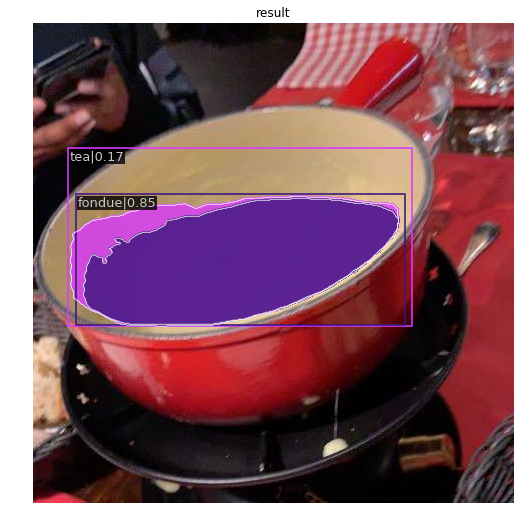

In [47]:

import time
import matplotlib
import matplotlib.pylab as plt
plt.rcParams["axes.grid"] = False

import mmcv
from mmcv.runner import load_checkpoint
import mmcv.visualization.image as mmcv_image
# fix for colab

def imshow(img, win_name='', wait_time=0): plt.figure(
    figsize=(50, 50)); plt.imshow(img)


mmcv_image.imshow = imshow
from mmdet.models import build_detector
from mmdet.apis import inference_detector, show_result_pyplot, init_detector


score_thr = 0.1 #decrease the threshold if you feel like you are missing some predictions


# build the model from a config file and a checkpoint file
model = init_detector(config_fname, checkpoint_file)

# test a single image and show the results
img = 'data/val/images/008082.jpg'   #you can change this to any image you want!

result = inference_detector(model, img)
show_result_pyplot(model, img, result, score_thr=0.16, title='result', wait_time=0)

load checkpoint from local path: /home/nkorneich/AICrowd/results_mask/latest.pth


/home/nkorneich/AICrowd/mmdetection/mmdet/datasets/utils.py:70: UserWarning: "ImageToTensor" pipeline is replaced by "DefaultFormatBundle" for batch inference. It is recommended to manually replace it in the test data pipeline in your config file.
  'data pipeline in your config file.', UserWarning)


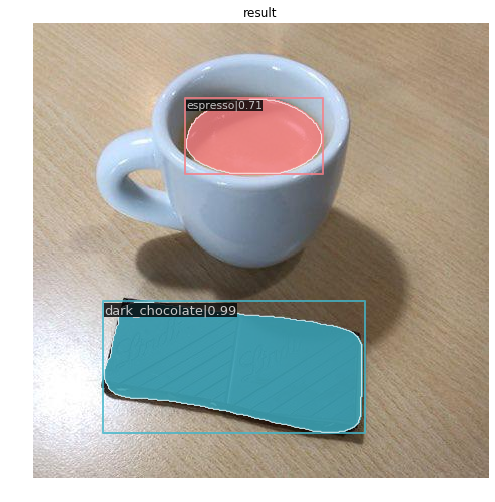

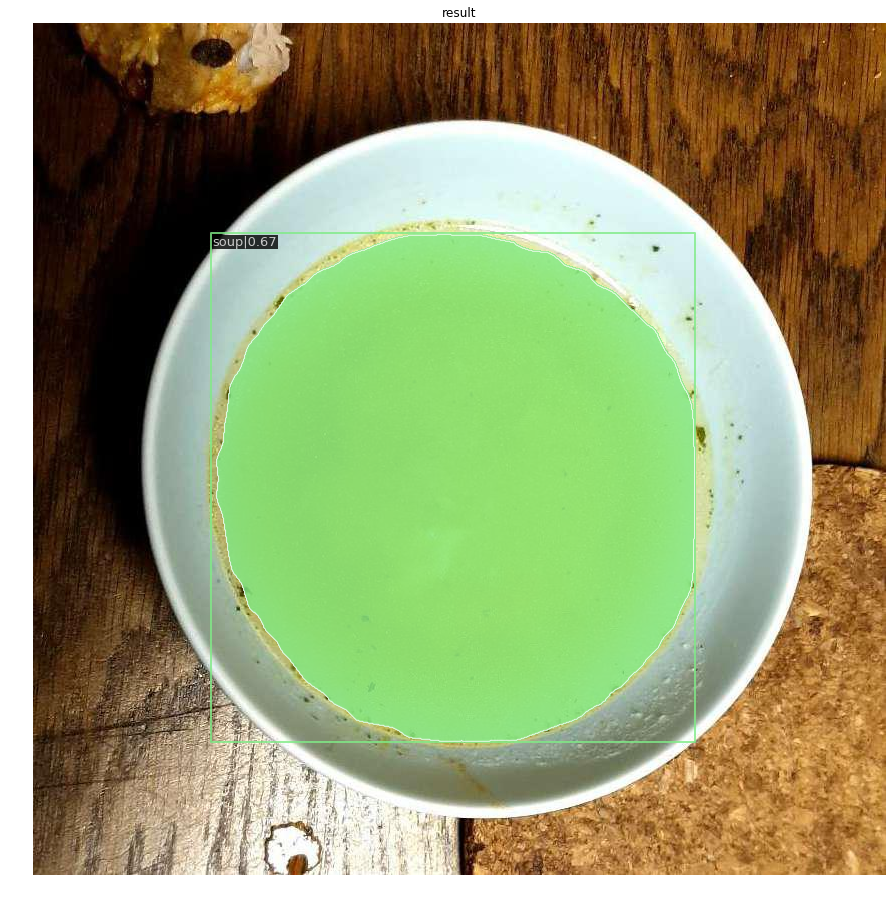

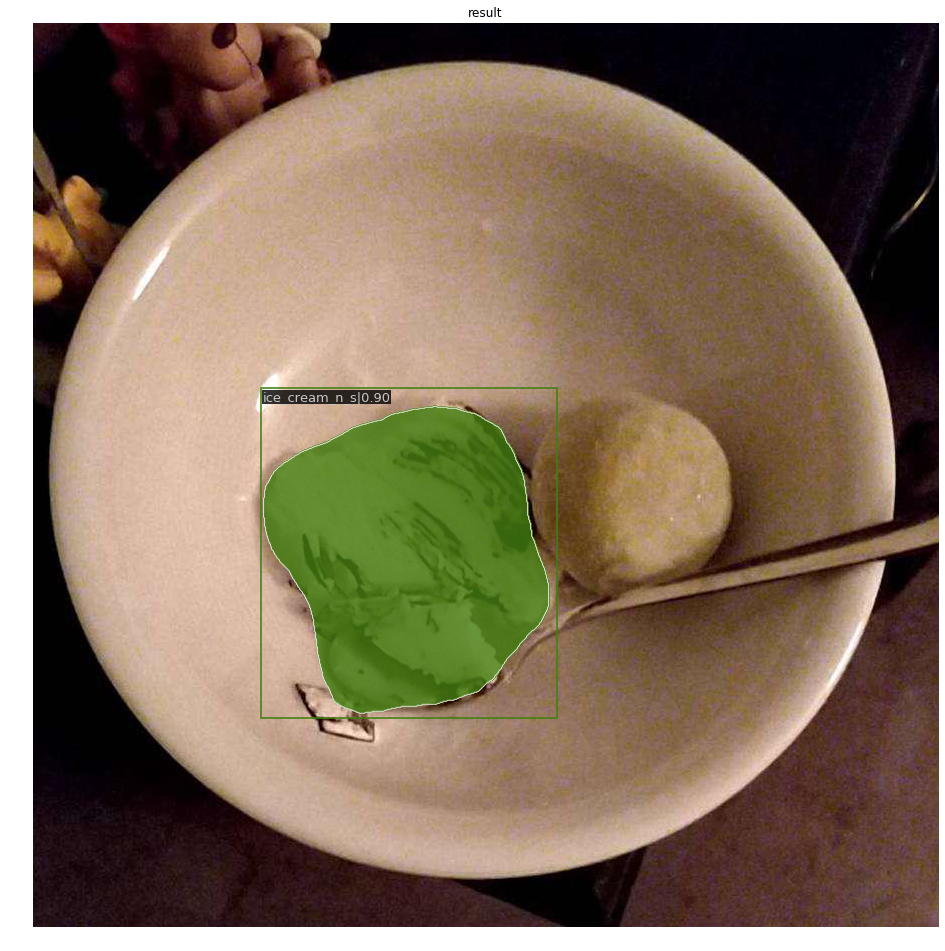

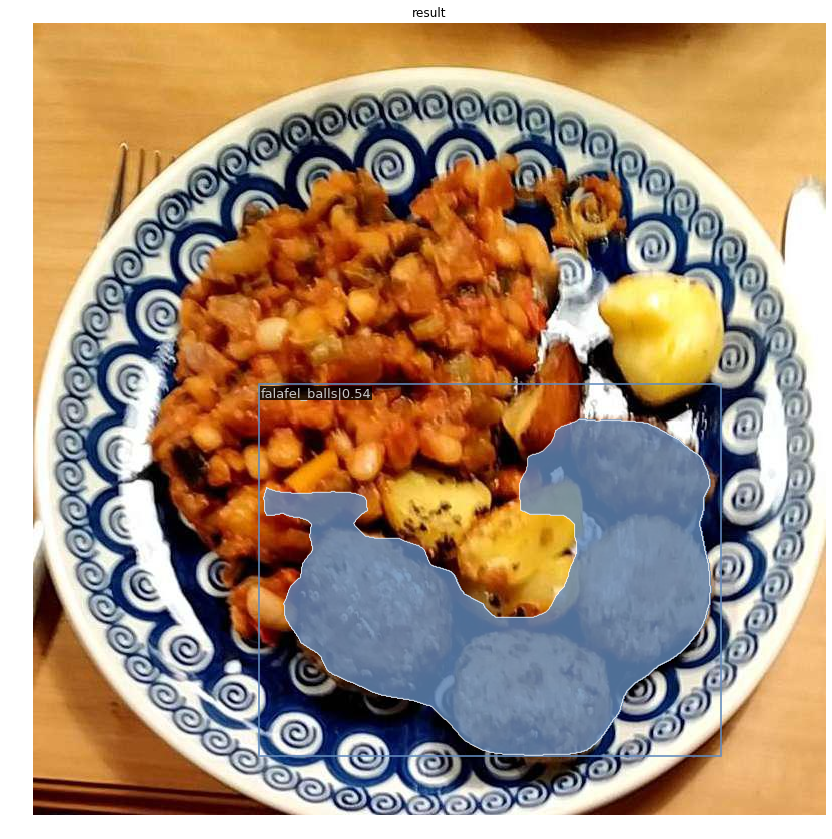

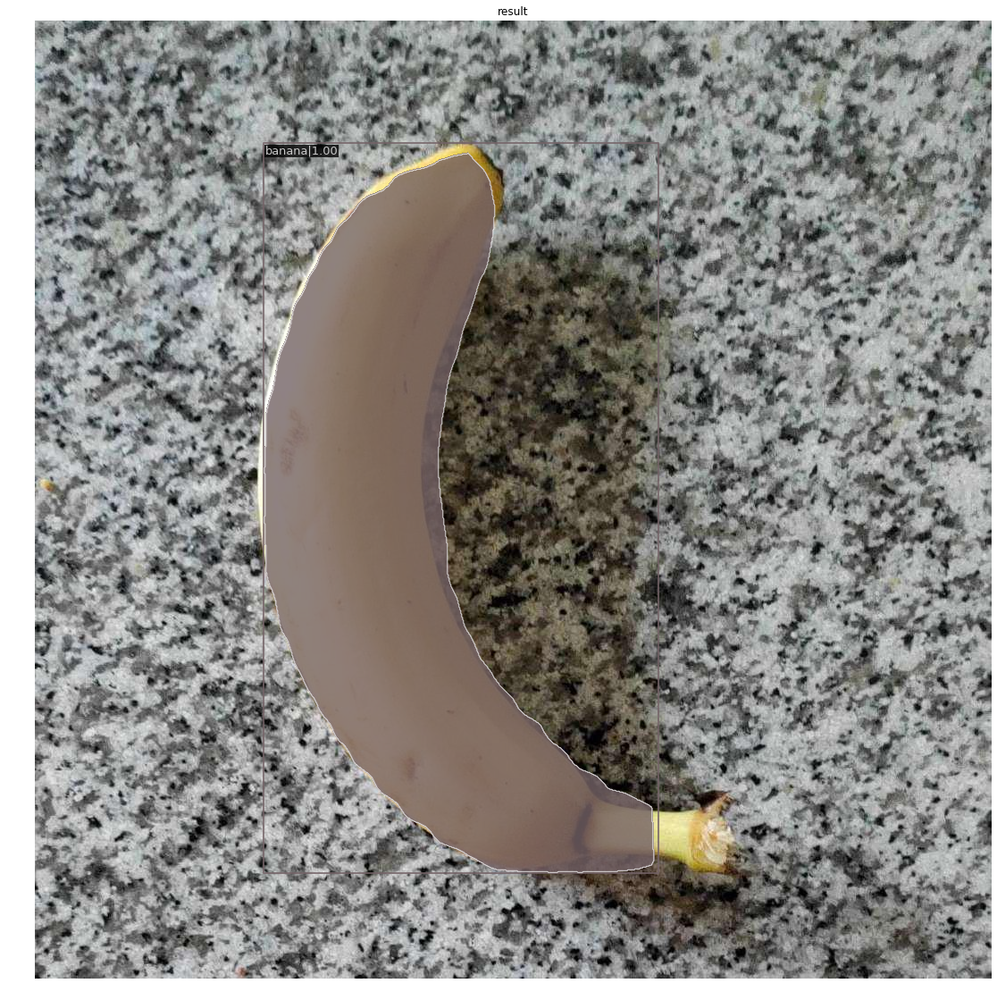

In [49]:
from mmdet.apis import inference_detector, init_detector
from mmdet.apis import show_result_pyplot

# build the model from a config file and a checkpoint file
model = init_detector(config_fname, checkpoint_file)

for i in range(0, 5):
    img = "data/val/images/" + val_json['images'][i]['file_name']
    result = inference_detector(model, img)
    show_result_pyplot(model, img, result, score_thr=0.5)

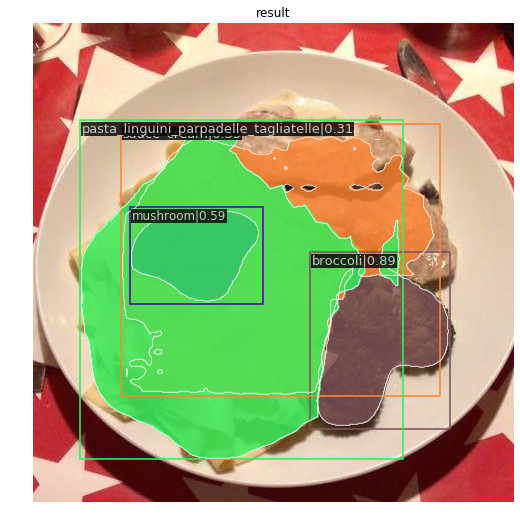

In [62]:
img = "data/test/images/008964.jpg"
result = inference_detector(model, img)
show_result_pyplot(model, img, result, score_thr=0.3)

In [66]:
with open("classes.json",'w') as f:
    json.dump(train_json["categories"],f)

In [78]:
#setting the paths for images and output file
test_images_dir="data/test/images"
output_filepath="results_mask/predictions_mmdetection.json"

#path of trained model & config
model_path="results_mask/latest.pth"
config_file="results_mask/my_config_mask_rcnn.py"

In [79]:
!python inference.py --config $config_file --checkpoint $model_path \
--data $test_images_dir \
--format-only --eval-options "jsonfile_prefix=preds" --out_file $output_filepath

/home/nkorneich/AICrowd/mmdetection/mmdet/datasets/api_wrappers/coco_api.py:22: UserWarning: mmpycocotools is deprecated. Please install official pycocotools by "pip install pycocotools"
  UserWarning)
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!

CocoDataset Test dataset with number of images 2819, and instance counts: 
+---------------------------------------------------------------+-------+---------------------------------------------------------+-------+---------------------------------------------+-------+----------------------------------------------+-------+-----------------------------------------------------+-------+
| category                                                      | count | category                                                | count | category                                    | count | category                                     | count | category                                            | count |
+----------------